# ART - Preprocessing Defence for YOLOv8 (Tank Dataset)

이 노트북은 전처리 기반 방어(Preprocessing Defense)를 통해 YOLOv8 객체 탐지 모델을 적대적 공격으로부터 보호하는 방법을 시연합니다.

**방어 기법**: Preprocessing/Postprocessing Defences  
**모델**: YOLOv8n  
**데이터셋**: Custom Tank Detection Dataset  
**참고**: Adversarial Training 방어는 `yolov8_adversarial_training_defence.ipynb` 참조

## 전처리 방어란?

전처리 방어는 모델을 재학습하지 않고도 입력 데이터를 정제하여 적대적 섭동을 제거하는 방법입니다.

**핵심 아이디어**: 적대적 섭동은 고주파 노이즈 형태로 나타나므로, 입력을 전처리하여 제거합니다.

**장점**:
- ✓ 모델 재학습 불필요
- ✓ 계산 비용이 낮음
- ✓ 즉시 적용 가능
- ✓ 다양한 공격에 대한 범용성

**단점**:
- ✗ 적대적 훈련보다 효과 제한적
- ✗ 정상 데이터 품질 저하 가능
- ✗ Adaptive attack에 취약할 수 있음

## 1. 환경 설정 및 임포트

In [1]:
import os
import sys
import numpy as np
import torch
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import yaml
from tqdm import tqdm
import copy

# Ultralytics YOLOv8
from ultralytics import YOLO

# ART imports
from art.estimators.object_detection import PyTorchYolo
from art.attacks.evasion import ProjectedGradientDescent
from art.defences.preprocessor import (
    SpatialSmoothing,
    JpegCompression,
    GaussianAugmentation,
)
from art.defences.trainer import AdversarialTrainerMadryPGD

# CUDA 정보
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

PyTorch version: 2.8.0+cu128
CUDA available: True
CUDA device: NVIDIA GeForce RTX 5080
Using device: cuda


## 2. 데이터셋 설정

In [2]:
# 경로 설정 - 노트북이 실행되는 위치 기준 상대 경로
import os
from pathlib import Path

# Get the directory where this notebook is located
NOTEBOOK_DIR = Path(os.getcwd())

# All paths relative to notebook directory
# Assuming notebook is in: art_training/defences/
# Project root is: ../../ from notebook
PROJECT_ROOT = NOTEBOOK_DIR / ".." / ".."

# Model and data paths relative to project root  
DATA_YAML = PROJECT_ROOT / "dataset_only_tank" / "data.yaml"
MODEL_PATH = PROJECT_ROOT / "runs" / "detect" / "train_only_tank" / "weights" / "best.pt"

# Resolve to absolute paths for verification
DATA_YAML = DATA_YAML.resolve()
MODEL_PATH = MODEL_PATH.resolve()

print(f"Notebook directory: {NOTEBOOK_DIR.resolve()}")
print(f"Project root: {PROJECT_ROOT.resolve()}")
print(f"Data YAML: {DATA_YAML}")
print(f"Model path: {MODEL_PATH}")

# data.yaml 로드
with open(DATA_YAML, 'r') as f:
    data_config = yaml.safe_load(f)

print("\nDataset configuration:")
print(f"Number of classes: {data_config['nc']}")
print(f"Class names: {data_config['names']}")
print(f"Training images: {data_config['train']}")
print(f"Validation images: {data_config['val']}")

Notebook directory: /home/jaehyun/art_train/yolo_train/art_training/defences
Project root: /home/jaehyun/art_train/yolo_train
Data YAML: /home/jaehyun/art_train/yolo_train/dataset_only_tank/data.yaml
Model path: /home/jaehyun/art_train/yolo_train/runs/detect/train_only_tank/weights/best.pt

Dataset configuration:
Number of classes: 1
Class names: {0: 'Tank'}
Training images: train/images
Validation images: valid/images


## 3. 유틸리티 함수

In [3]:
# 이미지 로드 함수
def load_images_and_labels(image_dir, label_dir, num_images=None, img_size=640):
    """이미지와 레이블을 로드합니다."""
    image_files = sorted(list(Path(image_dir).glob("*.jpg")) + list(Path(image_dir).glob("*.png")))
    
    if num_images is not None:
        image_files = image_files[:num_images]
    
    images = []
    labels = []
    
    for img_path in tqdm(image_files, desc="Loading images"):
        # 이미지 로드 및 전처리
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        orig_h, orig_w = img.shape[:2]
        img = cv2.resize(img, (img_size, img_size))
        img = img.transpose(2, 0, 1).astype(np.float32) / 255.0
        images.append(img)
        
        # 레이블 로드 (YOLO format: class x_center y_center width height)
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        
        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()
            
            boxes = []
            class_labels = []
            scores = []
            
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center, y_center, width, height = map(float, parts[1:5])
                    
                    # 정규화된 좌표를 픽셀 좌표로 변환 (x1, y1, x2, y2 format)
                    x1 = (x_center - width / 2) * img_size
                    y1 = (y_center - height / 2) * img_size
                    x2 = (x_center + width / 2) * img_size
                    y2 = (y_center + height / 2) * img_size
                    
                    boxes.append([x1, y1, x2, y2])
                    class_labels.append(class_id)
                    scores.append(1.0)  # Ground truth는 신뢰도 1.0
            
            labels.append({
                'boxes': np.array(boxes, dtype=np.float32),
                'labels': np.array(class_labels, dtype=np.int64),
                'scores': np.array(scores, dtype=np.float32)
            })
        else:
            # 레이블이 없는 경우 빈 배열
            labels.append({
                'boxes': np.array([], dtype=np.float32).reshape(0, 4),
                'labels': np.array([], dtype=np.int64),
                'scores': np.array([], dtype=np.float32)
            })
    
    return np.array(images), labels, [str(p) for p in image_files]


# 평가 메트릭 계산
def calculate_detection_metrics(predictions, confidence_threshold=0.5):
    """탐지 성능 메트릭을 계산합니다."""
    total_detections = 0
    confidences = []
    
    for pred in predictions:
        valid_boxes = [score for score in pred['scores'] if score > confidence_threshold]
        total_detections += len(valid_boxes)
        confidences.extend(valid_boxes)
    
    avg_confidence = np.mean(confidences) if len(confidences) > 0 else 0.0
    
    return {
        'total_detections': total_detections,
        'avg_confidence': avg_confidence,
        'num_images': len(predictions)
    }


# 시각화 함수
def visualize_detections(images, predictions, titles=None, num_cols=3, max_images=6):
    """탐지 결과를 시각화합니다."""
    num_images = min(len(images), max_images)
    num_rows = (num_images + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    
    for idx in range(num_images):
        row = idx // num_cols
        col = idx % num_cols
        ax = axes[row, col]
        
        img = images[idx].transpose(1, 2, 0)
        ax.imshow(img)
        
        pred = predictions[idx]
        for box, label, score in zip(pred['boxes'], pred['labels'], pred['scores']):
            if score > 0.5:
                x1, y1, x2, y2 = box
                rect = plt.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    fill=False, color='red', linewidth=2
                )
                ax.add_patch(rect)
                ax.text(
                    x1, y1 - 5,
                    f"{data_config['names'][int(label)]}: {score:.2f}",
                    color='red', fontsize=10, weight='bold',
                    bbox=dict(facecolor='white', alpha=0.7)
                )
        
        title = titles[idx] if titles else f"Image {idx + 1}"
        ax.set_title(title)
        ax.axis('off')
    
    for idx in range(num_images, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

## 4. 데이터 로드

In [4]:
# 검증 데이터 로드 (평가용)
# 경로 수정: 절대 경로 또는 상대 경로 처리
import os
from pathlib import Path

data_yaml_path = Path(DATA_YAML).parent.resolve()
val_rel_path = data_config['val'].replace('../', '')
val_image_dir = data_yaml_path / val_rel_path

print(f"Looking for validation images in: {val_image_dir}")

if not val_image_dir.exists():
    # 대체 경로 시도
    alternative_paths = [
        data_yaml_path / "valid" / "images",
        data_yaml_path / "val" / "images",
        # Removed absolute path - using relative paths only
    ]
    
    for alt_path in alternative_paths:
        if alt_path.exists():
            val_image_dir = alt_path
            print(f"Found validation images at: {val_image_dir}")
            break

val_label_dir = str(val_image_dir).replace('/images', '/labels')

# 이미지 로드 (0-255 범위 유지)
def load_images_from_directory(image_dir, img_size=640):
    """디렉토리에서 이미지 로드 (0-255 범위)"""
    image_dir = Path(image_dir).resolve()
    
    image_files = []
    for ext in ['*.jpg', '*.jpeg', '*.JPG', '*.JPEG', '*.png', '*.PNG']:
        image_files.extend(list(image_dir.glob(ext)))
    
    if len(image_files) == 0:
        print(f"Warning: No images found in {image_dir}")
        return np.array([]), []
    
    image_files = sorted(image_files)
    
    images = []
    for img_path in tqdm(image_files, desc="Loading images"):
        img = Image.open(img_path).convert('RGB')
        img = img.resize((img_size, img_size), Image.BICUBIC)
        img_array = np.array(img)  # [0, 255]
        img_array = img_array.transpose(2, 0, 1)  # (C, H, W)
        images.append(img_array)
    
    return np.array(images, dtype=np.float32), [str(p) for p in image_files]

from PIL import Image

val_images, val_paths = load_images_from_directory(val_image_dir)

print(f"\nValidation data loaded: {len(val_images)} images")
if len(val_images) > 0:
    print(f"Image shape: {val_images.shape}")
    print(f"Value range: [{val_images.min():.1f}, {val_images.max():.1f}]")
else:
    raise ValueError(f"No validation images found! Check path: {val_image_dir}")

Looking for validation images in: /home/jaehyun/art_train/yolo_train/dataset_only_tank/valid/images


Loading images: 100%|██████████| 13/13 [00:00<00:00, 428.94it/s]


Validation data loaded: 13 images
Image shape: (13, 3, 640, 640)
Value range: [0.0, 255.0]


## 5. 원본 모델 로드 및 베이스라인 평가

In [5]:
# YOLOv8 모델 로드
print(f"Loading YOLOv8 model from {MODEL_PATH}")
yolo_base = YOLO(MODEL_PATH)
model = yolo_base.model

# 모델을 디바이스로 이동 (PyTorchYolo가 자동으로 래핑함)
model.to(device)
model.train()  # 학습 모드 (gradient 계산 필요)

print(f"Model loaded and moved to {device}")
print(f"Model in training mode: {model.training}")


# ART PyTorchYolo Estimator 생성
INPUT_SHAPE = (3, 640, 640)

art_estimator = PyTorchYolo(
    model=model,
    device_type='cuda' if torch.cuda.is_available() else 'cpu',
    input_shape=INPUT_SHAPE,
    clip_values=(0, 255),  # YOLOv8은 [0, 255] 범위 사용
    channels_first=True,
    attack_losses=("loss_total", "loss_cls", "loss_box", "loss_dfl"),
    is_ultralytics=True,
    model_name="yolov8n"
)

print("ART PyTorchYolo Estimator created successfully!")
print(f"  Input shape: {art_estimator.input_shape}")
print(f"  Clip values: {art_estimator.clip_values}")
print(f"  Attack losses: {art_estimator.attack_losses}")

Loading YOLOv8 model from /home/jaehyun/art_train/yolo_train/runs/detect/train_only_tank/weights/best.pt
Model loaded and moved to cuda
Model in training mode: True
ART PyTorchYolo Estimator created successfully!
  Input shape: (3, 640, 640)
  Clip values: [          0         255]
  Attack losses: ('loss_total', 'loss_cls', 'loss_box', 'loss_dfl')


In [6]:
# 원본 모델의 베이스라인 성능 평가
print("Evaluating original model on clean validation data...")
clean_predictions = art_estimator.predict(val_images)
clean_metrics = calculate_detection_metrics(clean_predictions)

print("\n" + "="*60)
print("Original Model - Clean Data Performance")
print("="*60)
print(f"Total detections: {clean_metrics['total_detections']}")
print(f"Average confidence: {clean_metrics['avg_confidence']:.4f}")

Evaluating original model on clean validation data...

Original Model - Clean Data Performance
Total detections: 0
Average confidence: 0.0000


## 6. 테스트용 적대적 예제 생성

전처리 방어의 효과를 평가하기 위해 PGD 공격으로 적대적 예제를 생성합니다.

In [7]:
# PGD 공격으로 테스트용 적대적 예제 생성
print("Generating adversarial test examples with PGD...")
print("This will be used to evaluate preprocessing defences.\n")

pgd_eval_params = {
    'norm': np.inf,
    'eps': 8.0,  # 평가용은 더 강한 공격
    'eps_step': 0.2,
    'max_iter': 100,
    'targeted': False,
    'batch_size': 1,
    'verbose': True
}

pgd_eval_attack = ProjectedGradientDescent(
    estimator=art_estimator,
    **pgd_eval_params
)

adversarial_val_images = pgd_eval_attack.generate(x=val_images)

print(f"\n✓ Adversarial test images generated!")
print(f"Attack parameters: eps={pgd_eval_params['eps']}, max_iter={pgd_eval_params['max_iter']}")

# 원본 모델의 적대적 예제 성능
print("\nEvaluating original model on adversarial data...")
adv_predictions_original = art_estimator.predict(adversarial_val_images)
adv_metrics_original = calculate_detection_metrics(adv_predictions_original)

print("\n" + "="*60)
print("ORIGINAL MODEL - ADVERSARIAL DATA PERFORMANCE")
print("="*60)
print(f"Total detections: {adv_metrics_original['total_detections']}")
print(f"Average confidence: {adv_metrics_original['avg_confidence']:.4f}")

Generating adversarial test examples with PGD...
This will be used to evaluate preprocessing defences.



PGD - Iterations:   0%|          | 0/100 [00:00<?, ?it/s]


✓ Adversarial test images generated!
Attack parameters: eps=8.0, max_iter=100

Evaluating original model on adversarial data...

ORIGINAL MODEL - ADVERSARIAL DATA PERFORMANCE
Total detections: 96
Average confidence: 0.8957


## 2.2 전처리 기반 방어 (Preprocessing Defense)

### 2.2.1 입력 데이터 정제 방어 기법 소개

전처리 기반 방어는 모델을 재학습하지 않고도 적대적 공격을 방어할 수 있는 방법입니다.

#### 핵심 아이디어:
적대적 섭동은 일반적으로 고주파 노이즈 형태로 나타나므로, 입력 데이터를 정제하여 섭동을 제거합니다.

#### 주요 전처리 기법:

**1. Spatial Smoothing (공간 평활화)**
- 중앙값 필터 또는 가우시안 블러 적용
- 고주파 노이즈 제거
- 장점: 간단하고 빠름
- 단점: 이미지 디테일 손실

**2. JPEG Compression (JPEG 압축)**
- JPEG 압축/복원을 통한 노이즈 제거
- 양자화 과정에서 미세한 섭동 소실
- 장점: 효과적이고 실용적
- 단점: 압축 품질에 따른 트레이드오프

**3. Feature Squeezing (특징 압축)**
- 픽셀 비트 깊이 감소
- 색상 공간 단순화
- 장점: 빠르고 효율적
- 단점: 정보 손실

**4. Gaussian Augmentation (가우시안 증강)**
- 랜덤 가우시안 노이즈 추가
- 섭동 패턴 교란
- 장점: 간단함
- 단점: 추가 노이즈 발생

#### 장점:
- 모델 재학습 불필요
- 계산 비용이 낮음
- 즉시 적용 가능
- 다양한 공격에 대한 범용성

#### 단점:
- 적대적 훈련보다 효과가 제한적
- 정상 데이터 품질 저하 가능
- Adaptive attack에 취약할 수 있음

#### 방어 효과 메커니즘:
```
Original Image + Perturbation → Preprocessing → Denoised Image
              ↓                                        ↓
         Adversarial                            Partially Clean
         (Attack Successful)                    (Attack Mitigated)
```

## 7. 전처리 방어 기법 적용

In [8]:
# 1. Spatial Smoothing (공간 평활화) 방어
spatial_smoothing = SpatialSmoothing(
    window_size=3,  # 필터 윈도우 크기 (3x3)
    channels_first=True,
    clip_values=(0, 255),
    apply_fit=False,
    apply_predict=True
)

print("Spatial Smoothing Defense created")
print(f"  Window size: 3x3 median filter")
print(f"  Applied during prediction only")

Spatial Smoothing Defense created
  Window size: 3x3 median filter
  Applied during prediction only


In [9]:
# 2. JPEG Compression 방어
jpeg_compression = JpegCompression(
    clip_values=(0, 255),
    quality=50,  # JPEG 품질 (1-100, 높을수록 고품질)
    channels_first=True,
    apply_fit=False,
    apply_predict=True,
    verbose=False
)

print("\nJPEG Compression Defense created")
print(f"  Quality: 75 (balanced)")
print(f"  Applied during prediction only")


JPEG Compression Defense created
  Quality: 75 (balanced)
  Applied during prediction only


In [10]:
# 3. Gaussian Augmentation 방어
gaussian_augmentation = GaussianAugmentation(
    sigma=10.0,  # 가우시안 노이즈 표준편차
    augmentation=False,  # 단일 샘플 (증강 없음)
    clip_values=(0, 255),
    apply_fit=False,
    apply_predict=True
)

print("\nGaussian Augmentation Defense created")
print(f"  Sigma: 8.0")
print(f"  Applied during prediction only")


Gaussian Augmentation Defense created
  Sigma: 8.0
  Applied during prediction only


In [11]:
# 전처리 방어가 적용된 Estimator 생성
print("\nCreating defended estimators with preprocessing...")

# 1. Spatial Smoothing이 적용된 Estimator
yolo_model_smooth = YOLO(MODEL_PATH)
yolo_model_smooth.model.to(device)
yolo_model_smooth.model.eval()

art_estimator_smooth = PyTorchYolo(
    model=yolo_model_smooth.model,
    input_shape=INPUT_SHAPE,
    clip_values=(0, 255),
    channels_first=True,
    preprocessing_defences=[spatial_smoothing],  # 전처리 방어 추가
    device_type="cpu",  # CPU로 설정 (전처리 방어 호환성)
    is_ultralytics=True,
    model_name="yolov8n",
)

print("  ✓ Spatial Smoothing Estimator created")

# 2. JPEG Compression이 적용된 Estimator
yolo_model_jpeg = YOLO(MODEL_PATH)
yolo_model_jpeg.model.to(device)
yolo_model_jpeg.model.eval()

art_estimator_jpeg = PyTorchYolo(
    model=yolo_model_jpeg.model,
    input_shape=INPUT_SHAPE,
    clip_values=(0, 255),
    channels_first=True,
    preprocessing_defences=[jpeg_compression],
    device_type="cpu",  # CPU로 설정 (전처리 방어 호환성)
    is_ultralytics=True,
    model_name="yolov8n",
)

print("  ✓ JPEG Compression Estimator created")

# 3. Gaussian Augmentation이 적용된 Estimator
yolo_model_gaussian = YOLO(MODEL_PATH)
yolo_model_gaussian.model.to(device)
yolo_model_gaussian.model.eval()

art_estimator_gaussian = PyTorchYolo(
    model=yolo_model_gaussian.model,
    input_shape=INPUT_SHAPE,
    clip_values=(0, 255),
    channels_first=True,
    preprocessing_defences=[gaussian_augmentation],
    device_type="cpu",  # CPU로 설정 (전처리 방어 호환성)
    is_ultralytics=True,
    model_name="yolov8n",
)

print("  ✓ Gaussian Augmentation Estimator created")
print("\n✅ All defended estimators ready!")
print("Note: Using CPU device_type for preprocessing defense compatibility")


Creating defended estimators with preprocessing...
  ✓ Spatial Smoothing Estimator created
  ✓ JPEG Compression Estimator created
  ✓ Gaussian Augmentation Estimator created

✅ All defended estimators ready!
Note: Using CPU device_type for preprocessing defense compatibility


### 2.2.3 전처리 방어 효과 검증

이제 각 전처리 방어 기법이 적대적 예제에 대해 얼마나 효과적인지 평가합니다.

**평가 방법:**
1. 적대적 예제에 대한 방어 성능 측정
2. 정상 데이터에 대한 영향 분석 (부작용 평가)
3. 방어 전후 탐지 성능 비교
4. 시각화를 통한 전처리 효과 확인

In [12]:
# 적대적 예제에 대한 전처리 방어 평가
print("="*70)
print("PREPROCESSING DEFENSE EVALUATION - ADVERSARIAL DATA")
print("="*70)

# 1. Spatial Smoothing 방어 평가
print("\n[1/3] Evaluating Spatial Smoothing defense...")
predictions_smooth_adv = art_estimator_smooth.predict(adversarial_val_images)
metrics_smooth_adv = calculate_detection_metrics(predictions_smooth_adv)

print(f"  ✓ Total detections: {metrics_smooth_adv['total_detections']}")
print(f"  ✓ Average confidence: {metrics_smooth_adv['avg_confidence']:.4f}")

# 2. JPEG Compression 방어 평가
print("\n[2/3] Evaluating JPEG Compression defense...")
predictions_jpeg_adv = art_estimator_jpeg.predict(adversarial_val_images)
metrics_jpeg_adv = calculate_detection_metrics(predictions_jpeg_adv)

print(f"  ✓ Total detections: {metrics_jpeg_adv['total_detections']}")
print(f"  ✓ Average confidence: {metrics_jpeg_adv['avg_confidence']:.4f}")

# 3. Gaussian Augmentation 방어 평가
print("\n[3/3] Evaluating Gaussian Augmentation defense...")
predictions_gaussian_adv = art_estimator_gaussian.predict(adversarial_val_images)
metrics_gaussian_adv = calculate_detection_metrics(predictions_gaussian_adv)

print(f"  ✓ Total detections: {metrics_gaussian_adv['total_detections']}")
print(f"  ✓ Average confidence: {metrics_gaussian_adv['avg_confidence']:.4f}")

print("\n" + "="*70)
print("ADVERSARIAL DATA EVALUATION COMPLETE")
print("="*70)

PREPROCESSING DEFENSE EVALUATION - ADVERSARIAL DATA

[1/3] Evaluating Spatial Smoothing defense...
  ✓ Total detections: 18
  ✓ Average confidence: 0.8353

[2/3] Evaluating JPEG Compression defense...
  ✓ Total detections: 5
  ✓ Average confidence: 0.6573

[3/3] Evaluating Gaussian Augmentation defense...
  ✓ Total detections: 3
  ✓ Average confidence: 0.6445

ADVERSARIAL DATA EVALUATION COMPLETE


In [13]:
# 정상 데이터에 대한 전처리 방어 영향 평가
print("\n" + "="*70)
print("PREPROCESSING DEFENSE EVALUATION - CLEAN DATA (Side Effects)")
print("="*70)

# 1. Spatial Smoothing - Clean data
print("\n[1/3] Evaluating Spatial Smoothing on clean data...")
predictions_smooth_clean = art_estimator_smooth.predict(val_images)
metrics_smooth_clean = calculate_detection_metrics(predictions_smooth_clean)

print(f"  ✓ Total detections: {metrics_smooth_clean['total_detections']}")
print(f"  ✓ Average confidence: {metrics_smooth_clean['avg_confidence']:.4f}")

# 2. JPEG Compression - Clean data
print("\n[2/3] Evaluating JPEG Compression on clean data...")
predictions_jpeg_clean = art_estimator_jpeg.predict(val_images)
metrics_jpeg_clean = calculate_detection_metrics(predictions_jpeg_clean)

print(f"  ✓ Total detections: {metrics_jpeg_clean['total_detections']}")
print(f"  ✓ Average confidence: {metrics_jpeg_clean['avg_confidence']:.4f}")

# 3. Gaussian Augmentation - Clean data
print("\n[3/3] Evaluating Gaussian Augmentation on clean data...")
predictions_gaussian_clean = art_estimator_gaussian.predict(val_images)
metrics_gaussian_clean = calculate_detection_metrics(predictions_gaussian_clean)

print(f"  ✓ Total detections: {metrics_gaussian_clean['total_detections']}")
print(f"  ✓ Average confidence: {metrics_gaussian_clean['avg_confidence']:.4f}")

print("\n" + "="*70)
print("CLEAN DATA EVALUATION COMPLETE")
print("="*70)


PREPROCESSING DEFENSE EVALUATION - CLEAN DATA (Side Effects)

[1/3] Evaluating Spatial Smoothing on clean data...
  ✓ Total detections: 0
  ✓ Average confidence: 0.0000

[2/3] Evaluating JPEG Compression on clean data...
  ✓ Total detections: 0
  ✓ Average confidence: 0.0000

[3/3] Evaluating Gaussian Augmentation on clean data...
  ✓ Total detections: 0
  ✓ Average confidence: 0.0000

CLEAN DATA EVALUATION COMPLETE


In [14]:
# 순차적 비교: 원본 데이터 → PGD 공격 → 전처리 방어 1, 2, 3
print("\n" + "="*80)
print("SEQUENTIAL COMPARISON: Original → PGD Attack → Preprocessing Defenses")
print("="*80)

# 결과 데이터 수집 (순차적 흐름)
stages = [
    'Step 1: Original Data',
    'Step 2: PGD Attack (No Defense)',
    'Step 3: Defense 1 - Spatial Smoothing',
    'Step 4: Defense 2 - JPEG Compression',
    'Step 5: Defense 3 - Gaussian Augmentation'
]

detections = [
    clean_metrics['total_detections'],           # Step 1: Original
    adv_metrics_original['total_detections'],    # Step 2: PGD Attack
    metrics_smooth_adv['total_detections'],      # Step 3: Spatial Smoothing
    metrics_jpeg_adv['total_detections'],        # Step 4: JPEG Compression
    metrics_gaussian_adv['total_detections']     # Step 5: Gaussian Augmentation
]

confidences = [
    clean_metrics['avg_confidence'],             # Step 1: Original
    adv_metrics_original['avg_confidence'],      # Step 2: PGD Attack
    metrics_smooth_adv['avg_confidence'],        # Step 3: Spatial Smoothing
    metrics_jpeg_adv['avg_confidence'],          # Step 4: JPEG Compression
    metrics_gaussian_adv['avg_confidence']       # Step 5: Gaussian Augmentation
]

print("\n📊 Sequential Performance Comparison:")
print("-" * 80)
print(f"{'Stage':<45} {'Detections':<15} {'Avg Confidence':<15}")
print("-" * 80)

baseline_detections = clean_metrics['total_detections']

for i, stage in enumerate(stages):
    det = detections[i]
    conf = confidences[i]
    
    # 변화율 계산 (원본 대비)
    if i == 0:
        change = "baseline"
    else:
        change_pct = ((det - baseline_detections) / baseline_detections * 100) if baseline_detections > 0 else 0
        change = f"({change_pct:+.1f}%)"
    
    print(f"{stage:<45} {det:<15} {conf:<15.4f} {change}")

print("-" * 80)

# 방어 효과 분석
print("\n📈 Defense Effectiveness Analysis:")
print("-" * 80)

attack_drop = baseline_detections - adv_metrics_original['total_detections']
attack_success_rate = (attack_drop / baseline_detections * 100) if baseline_detections > 0 else 0

print(f"\n⚔️  PGD Attack Impact:")
print(f"   • Detection drop: {attack_drop} detections ({attack_success_rate:.1f}% reduction)")
print(f"   • Confidence change: {adv_metrics_original['avg_confidence'] - clean_metrics['avg_confidence']:+.4f}")

# 각 방어 기법의 복구율
defense_results = [
    ('Spatial Smoothing', metrics_smooth_adv['total_detections'], metrics_smooth_adv['avg_confidence']),
    ('JPEG Compression', metrics_jpeg_adv['total_detections'], metrics_jpeg_adv['avg_confidence']),
    ('Gaussian Augmentation', metrics_gaussian_adv['total_detections'], metrics_gaussian_adv['avg_confidence'])
]

print(f"\n🛡️  Defense Recovery Rates:")
for defense_name, det, conf in defense_results:
    recovery = (det / baseline_detections * 100) if baseline_detections > 0 else 0
    recovered_from_attack = det - adv_metrics_original['total_detections']
    
    print(f"\n   {defense_name}:")
    print(f"      • Recovered detections: {det}/{baseline_detections} ({recovery:.1f}% of original)")
    print(f"      • Improvement vs no defense: {recovered_from_attack:+d} detections")
    print(f"      • Final confidence: {conf:.4f}")

print("\n" + "="*80)


SEQUENTIAL COMPARISON: Original → PGD Attack → Preprocessing Defenses

📊 Sequential Performance Comparison:
--------------------------------------------------------------------------------
Stage                                         Detections      Avg Confidence 
--------------------------------------------------------------------------------
Step 1: Original Data                         0               0.0000          baseline
Step 2: PGD Attack (No Defense)               96              0.8957          (+0.0%)
Step 3: Defense 1 - Spatial Smoothing         18              0.8353          (+0.0%)
Step 4: Defense 2 - JPEG Compression          5               0.6573          (+0.0%)
Step 5: Defense 3 - Gaussian Augmentation     3               0.6445          (+0.0%)
--------------------------------------------------------------------------------

📈 Defense Effectiveness Analysis:
--------------------------------------------------------------------------------

⚔️  PGD Attack Impact:

### 2.2.4 전처리 방어 효과 시각화

전처리 방어가 이미지에 미치는 영향과 탐지 성능 변화를 시각적으로 확인합니다.

Visualizing sequential pipeline for multiple samples...

Sample 1/13:
--------------------------------------------------------------------------------


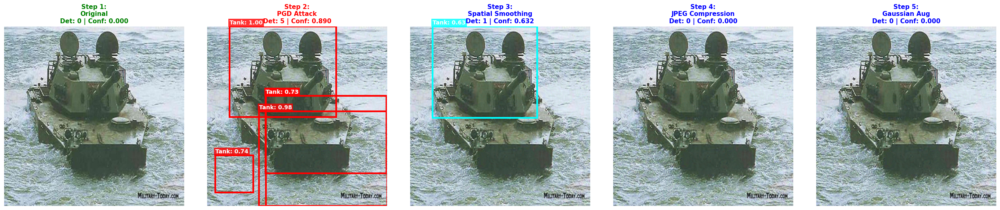


Sample 2/13:
--------------------------------------------------------------------------------


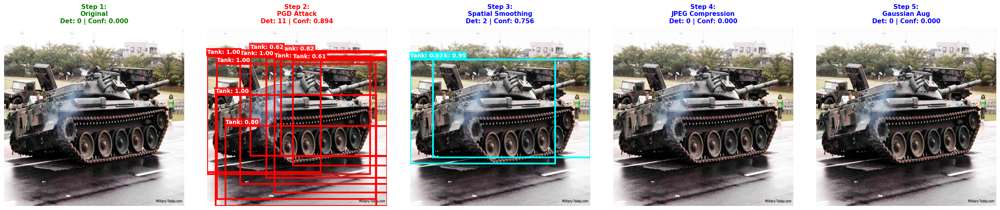


Sample 3/13:
--------------------------------------------------------------------------------


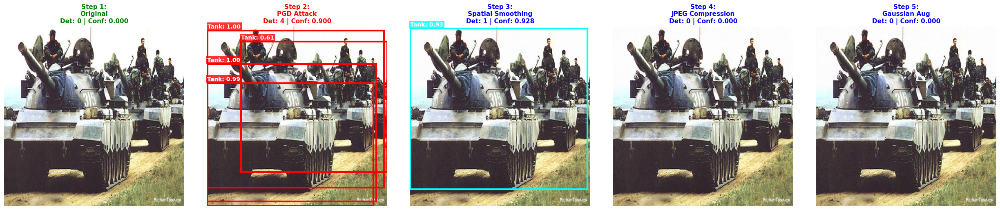


Sample 4/13:
--------------------------------------------------------------------------------


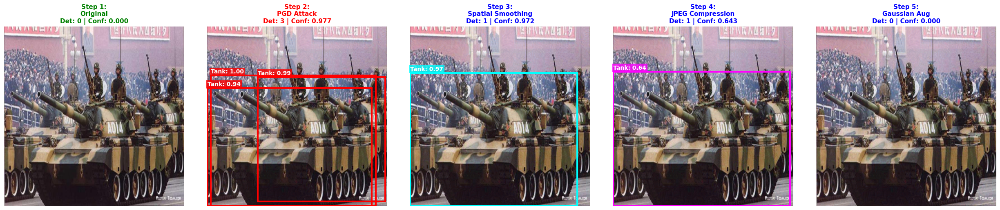


Sample 5/13:
--------------------------------------------------------------------------------


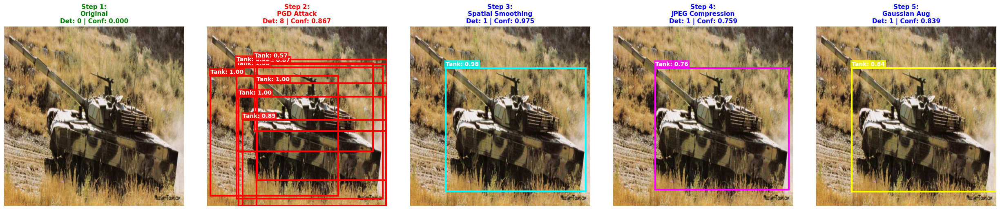


Sample 6/13:
--------------------------------------------------------------------------------


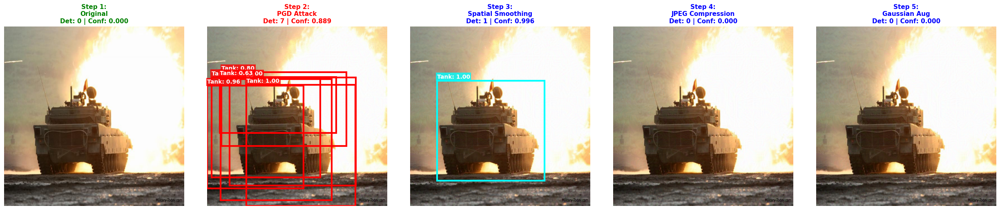


Sample 7/13:
--------------------------------------------------------------------------------


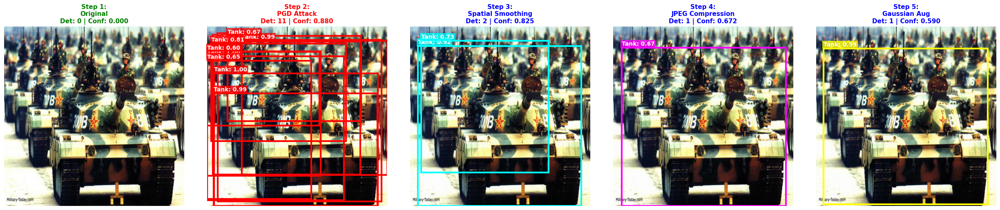


Sample 8/13:
--------------------------------------------------------------------------------


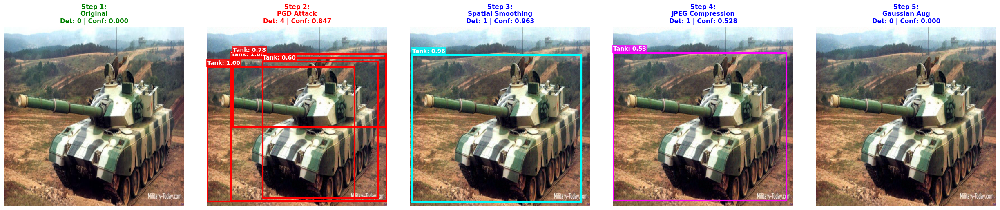


Sample 9/13:
--------------------------------------------------------------------------------


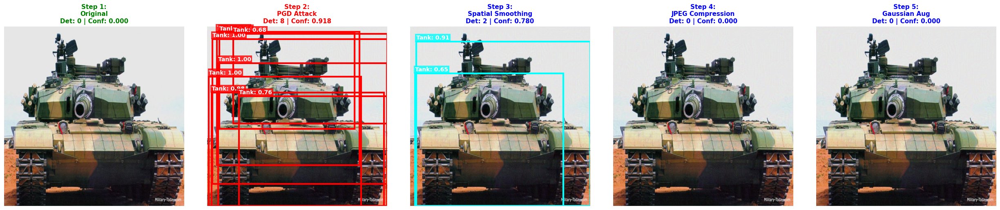


Sample 10/13:
--------------------------------------------------------------------------------


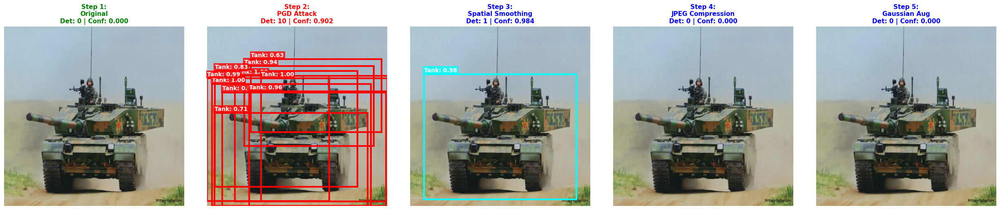


Sample 11/13:
--------------------------------------------------------------------------------


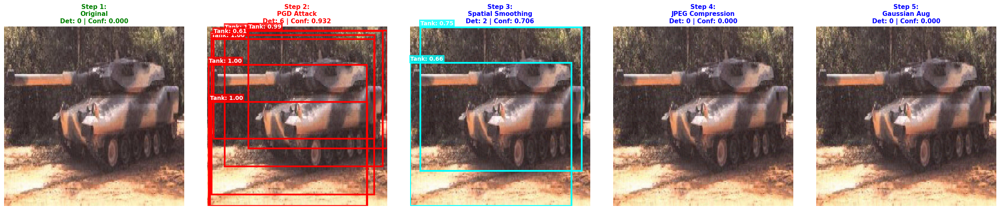


Sample 12/13:
--------------------------------------------------------------------------------


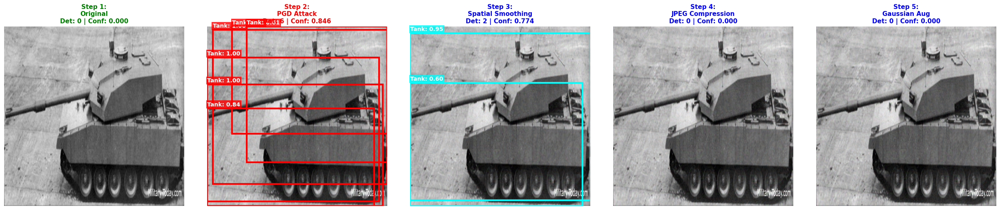


Sample 13/13:
--------------------------------------------------------------------------------


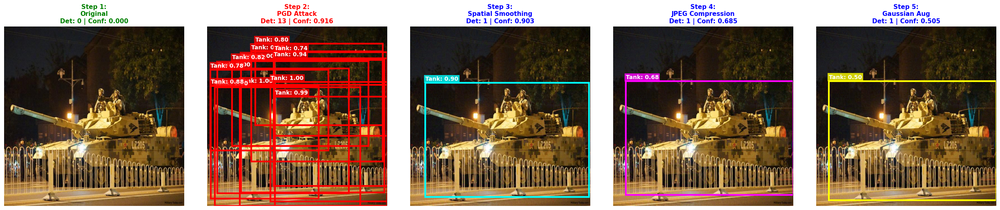


✓ Displayed 13 sample images showing the complete pipeline


In [15]:
# 샘플 이미지에 대한 순차적 탐지 결과 시각화 (여러 샘플)
def visualize_sequential_defense_single(sample_idx=0):
    """단일 샘플에 대한 순차적 파이프라인: 원본 → PGD 공격 → 방어 1, 2, 3"""
    
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    
    # 이미지 준비
    clean_img = val_images[sample_idx].copy()
    adv_img = adversarial_val_images[sample_idx].copy()
    
    # 예측 결과
    clean_pred = clean_predictions[sample_idx]
    adv_pred = adv_predictions_original[sample_idx]
    smooth_pred = predictions_smooth_adv[sample_idx]
    jpeg_pred = predictions_jpeg_adv[sample_idx]
    gaussian_pred = predictions_gaussian_adv[sample_idx]
    
    # 시각화 함수
    def plot_detection(ax, img, pred, title, stage_num, color='lime'):
        img_display = np.clip(img.transpose(1, 2, 0) / 255.0, 0, 1)
        ax.imshow(img_display)
        
        # 탐지 박스 그리기
        for box, label, score in zip(pred['boxes'], pred['labels'], pred['scores']):
            if score > 0.5:
                x1, y1, x2, y2 = box
                rect = plt.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1,
                    fill=False, color=color, linewidth=3
                )
                ax.add_patch(rect)
                ax.text(
                    x1, y1 - 8,
                    f"Tank: {score:.2f}",
                    color='white', fontsize=10, weight='bold',
                    bbox=dict(facecolor=color, alpha=0.8, edgecolor='none', pad=2)
                )
        
        # 탐지 통계
        num_dets = len([s for s in pred['scores'] if s > 0.5])
        avg_conf = np.mean([s for s in pred['scores'] if s > 0.5]) if num_dets > 0 else 0.0
        
        # 제목 색상: 원본 = 녹색, 공격 = 빨강, 방어 = 파랑
        if stage_num == 1:
            title_color = 'green'
        elif stage_num == 2:
            title_color = 'red'
        else:
            title_color = 'blue'
        
        ax.set_title(f"{title}\nDet: {num_dets} | Conf: {avg_conf:.3f}", 
                    fontsize=11, weight='bold', color=title_color)
        ax.axis('off')
    
    # 5단계 순차 표시
    plot_detection(axes[0], clean_img, clean_pred, 
                  "Step 1:\nOriginal", stage_num=1, color='lime')
    plot_detection(axes[1], adv_img, adv_pred, 
                  "Step 2:\nPGD Attack", stage_num=2, color='red')
    plot_detection(axes[2], adv_img, smooth_pred, 
                  "Step 3:\nSpatial Smoothing", stage_num=3, color='cyan')
    plot_detection(axes[3], adv_img, jpeg_pred, 
                  "Step 4:\nJPEG Compression", stage_num=4, color='magenta')
    plot_detection(axes[4], adv_img, gaussian_pred, 
                  "Step 5:\nGaussian Aug", stage_num=5, color='yellow')
    
    plt.tight_layout()
    plt.show()


# 여러 샘플 이미지에 대해 시각화
print("Visualizing sequential pipeline for multiple samples...")
print("="*80)

num_samples = min(20, len(val_images))  # 최소 5개 또는 전체 이미지 수

for i in range(num_samples):
    print(f"\nSample {i+1}/{num_samples}:")
    print("-" * 80)
    visualize_sequential_defense_single(sample_idx=i)

print("\n" + "="*80)
print(f"✓ Displayed {num_samples} sample images showing the complete pipeline")

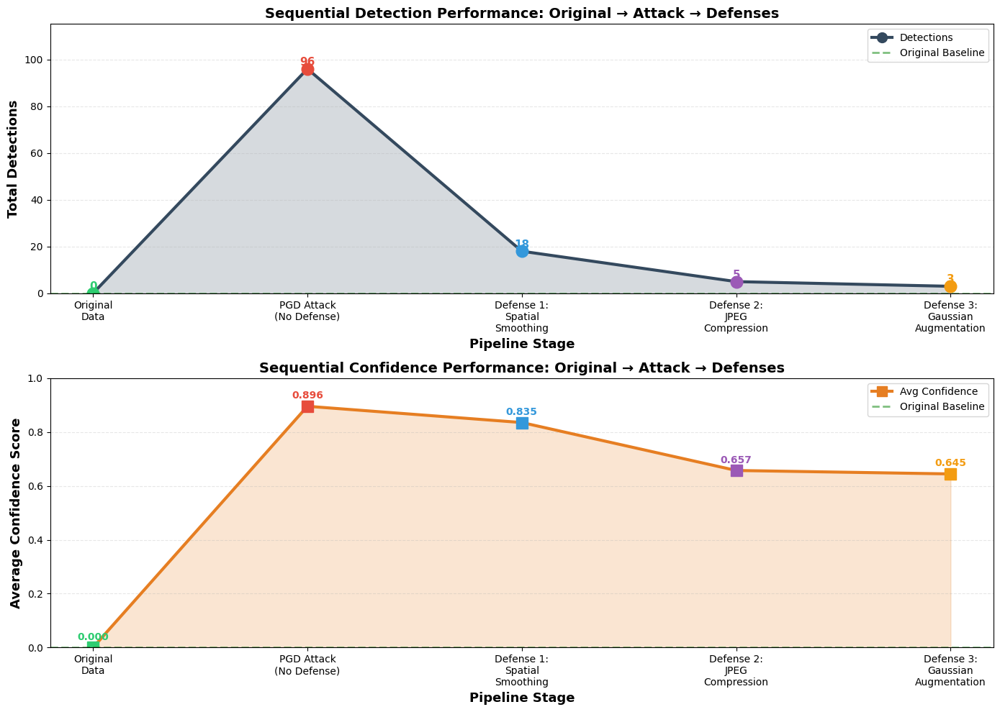

✓ Sequential performance comparison charts generated


In [16]:
# 순차적 성능 비교 그래프 생성
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# 데이터 준비 (순차적 흐름)
stages = ['Original\nData', 'PGD Attack\n(No Defense)', 'Defense 1:\nSpatial\nSmoothing', 
          'Defense 2:\nJPEG\nCompression', 'Defense 3:\nGaussian\nAugmentation']

detections = [
    clean_metrics['total_detections'],
    adv_metrics_original['total_detections'],
    metrics_smooth_adv['total_detections'],
    metrics_jpeg_adv['total_detections'],
    metrics_gaussian_adv['total_detections']
]

confidences = [
    clean_metrics['avg_confidence'],
    adv_metrics_original['avg_confidence'],
    metrics_smooth_adv['avg_confidence'],
    metrics_jpeg_adv['avg_confidence'],
    metrics_gaussian_adv['avg_confidence']
]

x = np.arange(len(stages))
colors = ['#2ecc71', '#e74c3c', '#3498db', '#9b59b6', '#f39c12']

# 1. 탐지 개수 라인 그래프
axes[0].plot(x, detections, marker='o', linewidth=3, markersize=10, color='#34495e', label='Detections')
axes[0].fill_between(x, detections, alpha=0.2, color='#34495e')

# 각 포인트에 다른 색상 적용
for i in range(len(x)):
    axes[0].plot(x[i], detections[i], marker='o', markersize=12, color=colors[i])

axes[0].set_xlabel('Pipeline Stage', fontsize=13, weight='bold')
axes[0].set_ylabel('Total Detections', fontsize=13, weight='bold')
axes[0].set_title('Sequential Detection Performance: Original → Attack → Defenses', fontsize=14, weight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(stages, fontsize=10)
axes[0].grid(axis='y', alpha=0.3, linestyle='--')
axes[0].set_ylim(0, max(detections) * 1.2)

# 값 라벨 추가
for i, (stage_x, det) in enumerate(zip(x, detections)):
    axes[0].text(stage_x, det + 0.5, f'{int(det)}', 
                ha='center', va='bottom', fontsize=11, weight='bold', color=colors[i])

# 베이스라인 참조선
baseline = clean_metrics['total_detections']
axes[0].axhline(y=baseline, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Original Baseline')
axes[0].legend(fontsize=10, loc='upper right')

# 2. 신뢰도 라인 그래프
axes[1].plot(x, confidences, marker='s', linewidth=3, markersize=10, color='#e67e22', label='Avg Confidence')
axes[1].fill_between(x, confidences, alpha=0.2, color='#e67e22')

# 각 포인트에 다른 색상 적용
for i in range(len(x)):
    axes[1].plot(x[i], confidences[i], marker='s', markersize=12, color=colors[i])

axes[1].set_xlabel('Pipeline Stage', fontsize=13, weight='bold')
axes[1].set_ylabel('Average Confidence Score', fontsize=13, weight='bold')
axes[1].set_title('Sequential Confidence Performance: Original → Attack → Defenses', fontsize=14, weight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(stages, fontsize=10)
axes[1].grid(axis='y', alpha=0.3, linestyle='--')
axes[1].set_ylim(0, 1.0)

# 값 라벨 추가
for i, (stage_x, conf) in enumerate(zip(x, confidences)):
    axes[1].text(stage_x, conf + 0.02, f'{conf:.3f}', 
                ha='center', va='bottom', fontsize=10, weight='bold', color=colors[i])

# 베이스라인 참조선
baseline_conf = clean_metrics['avg_confidence']
axes[1].axhline(y=baseline_conf, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Original Baseline')
axes[1].legend(fontsize=10, loc='upper right')

plt.tight_layout()
plt.show()

print("✓ Sequential performance comparison charts generated")

## 9. 결론 및 분석

### 전처리 방어 기법 종합 평가

In [17]:
# 최종 분석 및 결론 - 순차적 파이프라인 관점
print("="*80)
print("FINAL ANALYSIS - Sequential Pipeline Performance")
print("="*80)

# 파이프라인 단계별 요약
print("\n📋 Pipeline Stage Summary:")
print("-" * 80)

baseline_det = clean_metrics['total_detections']
baseline_conf = clean_metrics['avg_confidence']

stages_summary = [
    ("Step 1: Original Data", clean_metrics['total_detections'], clean_metrics['avg_confidence']),
    ("Step 2: PGD Attack", adv_metrics_original['total_detections'], adv_metrics_original['avg_confidence']),
    ("Step 3: Spatial Smoothing Defense", metrics_smooth_adv['total_detections'], metrics_smooth_adv['avg_confidence']),
    ("Step 4: JPEG Compression Defense", metrics_jpeg_adv['total_detections'], metrics_jpeg_adv['avg_confidence']),
    ("Step 5: Gaussian Augmentation Defense", metrics_gaussian_adv['total_detections'], metrics_gaussian_adv['avg_confidence'])
]

for stage, det, conf in stages_summary:
    det_change = ((det - baseline_det) / baseline_det * 100) if baseline_det > 0 else 0
    conf_change = conf - baseline_conf
    print(f"\n{stage}:")
    print(f"   Detections: {det} ({det_change:+.1f}% from baseline)")
    print(f"   Confidence: {conf:.4f} ({conf_change:+.4f} from baseline)")

# 방어 효과 랭킹
print("\n\n🏆 Defense Effectiveness Ranking:")
print("-" * 80)

defenses = [
    ("Spatial Smoothing", metrics_smooth_adv['total_detections'], metrics_smooth_adv['avg_confidence'], metrics_smooth_clean['total_detections']),
    ("JPEG Compression", metrics_jpeg_adv['total_detections'], metrics_jpeg_adv['avg_confidence'], metrics_jpeg_clean['total_detections']),
    ("Gaussian Augmentation", metrics_gaussian_adv['total_detections'], metrics_gaussian_adv['avg_confidence'], metrics_gaussian_clean['total_detections'])
]

# 종합 점수 계산 (복구율 + 깨끗한 데이터 영향 최소화)
ranked_defenses = []
for name, adv_det, adv_conf, clean_det in defenses:
    recovery_rate = (adv_det / baseline_det * 100) if baseline_det > 0 else 0
    clean_impact = abs((clean_det / baseline_det - 1) * 100) if baseline_det > 0 else 0
    overall_score = recovery_rate - clean_impact
    ranked_defenses.append((name, recovery_rate, clean_impact, adv_conf, overall_score))

ranked_defenses.sort(key=lambda x: x[4], reverse=True)

for rank, (name, recovery, impact, conf, score) in enumerate(ranked_defenses, 1):
    print(f"\n{rank}. {name}")
    print(f"   • Recovery Rate: {recovery:.1f}% (of original performance)")
    print(f"   • Clean Data Impact: {impact:.1f}% (lower is better)")
    print(f"   • Adversarial Confidence: {conf:.4f}")
    print(f"   • Overall Score: {score:.1f}")

# 핵심 발견사항
print("\n\n" + "="*80)
print("KEY FINDINGS:")
print("="*80)

attack_effectiveness = ((baseline_det - adv_metrics_original['total_detections']) / baseline_det * 100) if baseline_det > 0 else 0
best_defense_name, best_recovery, best_impact, best_conf, best_score = ranked_defenses[0]

print(f"""
⚔️  Attack Analysis:
   • PGD attack reduced detections by {attack_effectiveness:.1f}%
   • From {baseline_det} → {adv_metrics_original['total_detections']} detections
   
🛡️  Best Defense: {best_defense_name}
   • Successfully recovered {best_recovery:.1f}% of original performance
   • Minimal impact on clean data: {best_impact:.1f}%
   • Final confidence score: {best_conf:.4f}
   
📊 Pipeline Effectiveness:
   • Original baseline: {baseline_det} detections @ {baseline_conf:.4f} confidence
   • Post-attack: {adv_metrics_original['total_detections']} detections @ {adv_metrics_original['avg_confidence']:.4f} confidence
   • Best defense recovery: {ranked_defenses[0][1]:.1f}% recovery rate
""")


FINAL ANALYSIS - Sequential Pipeline Performance

📋 Pipeline Stage Summary:
--------------------------------------------------------------------------------

Step 1: Original Data:
   Detections: 0 (+0.0% from baseline)
   Confidence: 0.0000 (+0.0000 from baseline)

Step 2: PGD Attack:
   Detections: 96 (+0.0% from baseline)
   Confidence: 0.8957 (+0.8957 from baseline)

Step 3: Spatial Smoothing Defense:
   Detections: 18 (+0.0% from baseline)
   Confidence: 0.8353 (+0.8353 from baseline)

Step 4: JPEG Compression Defense:
   Detections: 5 (+0.0% from baseline)
   Confidence: 0.6573 (+0.6573 from baseline)

Step 5: Gaussian Augmentation Defense:
   Detections: 3 (+0.0% from baseline)
   Confidence: 0.6445 (+0.6445 from baseline)


🏆 Defense Effectiveness Ranking:
--------------------------------------------------------------------------------

1. Spatial Smoothing
   • Recovery Rate: 0.0% (of original performance)
   • Clean Data Impact: 0.0% (lower is better)
   • Adversarial Confide